In [1]:
import cv2 as cv
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import networkx as nx
from IPython.display import Audio, display
import ipynb.fs.defs.Utils as Utils
import ipynb.fs.defs.GraphBuilding as GraphBuilding

In [2]:
#Directories
dataset_name = 'mountain_dataset'
dataset_dir = f'datasets/{dataset_name}'
output_dir ="output"
stitching_dir = "stitched"
partial_results_dir = "partial"

In [3]:
#global variables
save_output = True
save_images = True
output_dir ="output"
results_dir = "results"
verbose = False

In [4]:
#simple graph parameters
simple_matching_threshold = 0.6
simple_matches_th = 10
simple_RANSACmaxIters = 2000
load_simple_matrices = True

In [5]:
#generalstitching parameters
automatic_idx_computation = True
idx_ref = 0
idxs = None
beautify = True

In [6]:
#simple graph stitching parameters
simple_graph_stitching_dir = "simple_graph"
simple_graph_wap_shape = [10000,10000]

In [7]:
#Load images from the folder
imgs = Utils.load_images_from_folder(dataset_dir)
imgs_duplicates = [img.copy() for img in imgs]

In [8]:
M, Z, C, adj_matrix, weight_matrix = GraphBuilding.build_graph_matrices(dataset_name,
            imgs_duplicates,
            matching_threshold = simple_matching_threshold,
            number_of_matches=1,
            matches_th = simple_matches_th ,
            RANSACmaxIters = simple_RANSACmaxIters,
            save_output = save_output,
            save_images = save_images,
            output_dir = output_dir,
            results_dir = results_dir,
            verbose = verbose)

In [9]:
if automatic_idx_computation:
    idx_ref = Utils.get_reference_node(adj_matrix)

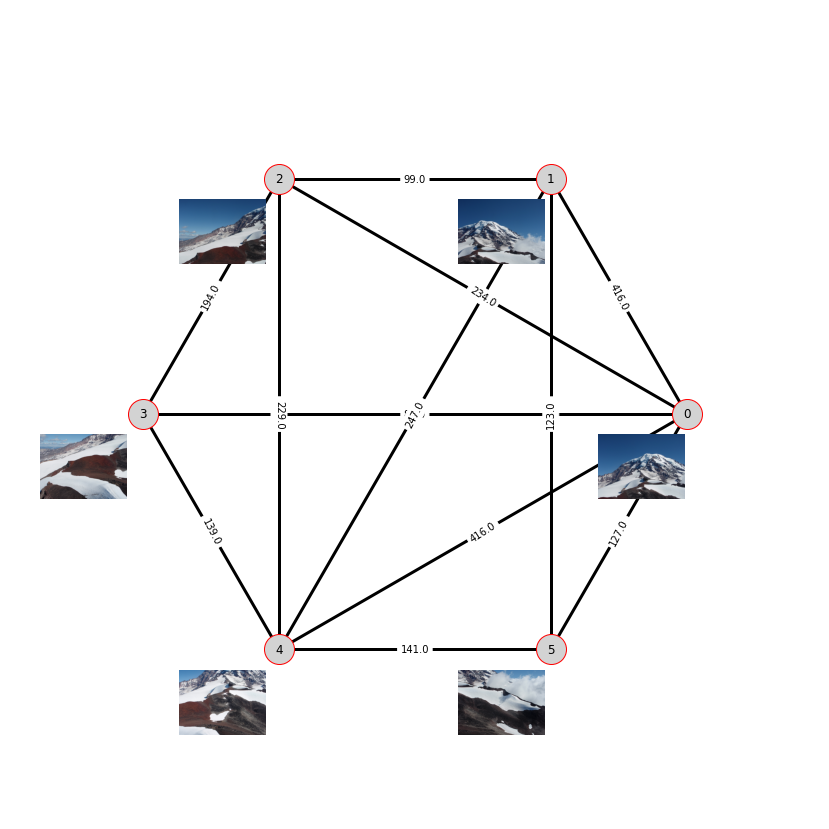

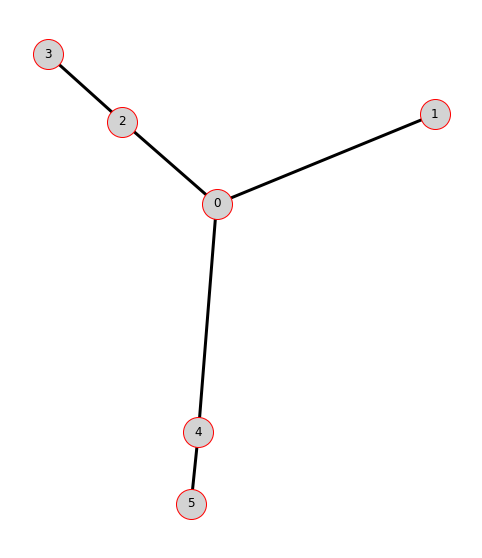

In [10]:
graph = Utils.build_and_print_graph(imgs, 
                                  adj_matrix, 
                                  weight_matrix, 
                                  save_output, 
                                  output_dir,
                                  "graph")

spanning_tree = nx.maximum_spanning_tree(graph)

Utils.print_graph(spanning_tree, save_output, output_dir, "spanning-tree")

In [11]:
idx_ref

0

In [12]:
def click_event(event, x, y, flags, params):
    [image_name,img,points] = params
 
    # checking for left mouse clicks
    if event == cv.EVENT_LBUTTONDOWN:
 
        # displaying the coordinates
        # on the Shell
        #print(x, ' ', y)
        points.append([x,y])
            
        print(points)
 
        # displaying the coordinates
        # on the image window
        font = cv.FONT_HERSHEY_SIMPLEX
        cv.putText(img, str(x) + ',' +
                    str(y), (x,y), font,
                    1, (255, 0, 0), 2)
        cv.imshow(image_name, cv.cvtColor(img,cv.COLOR_RGB2BGR))

In [13]:
def compute_homography(base_img,img):
    base_img_name = 'base_image'
    image_name = 'image'
    stitched = base_img
    
    points = list()
    base_points = list()
    
    
    final_size = np.array([900 , 1000])
    img_size = np.array(img.shape[:2])
    
    scaling = (min(final_size / img_size))
    
    dim = (img_size*scaling).astype(int)[::-1]

    # resize image
    img = cv.resize(img, dim, interpolation = cv.INTER_AREA)
    base_img = cv.resize(base_img, dim, interpolation = cv.INTER_AREA)
    
    cv.imshow(image_name,cv.cvtColor(img,cv.COLOR_RGB2BGR) )
    cv.imshow(base_img_name,cv.cvtColor(base_img,cv.COLOR_RGB2BGR) )
    
    cv.setMouseCallback(image_name, click_event, [image_name,img.copy(),points])
    cv.setMouseCallback(base_img_name, click_event, [base_img_name,base_img.copy(),base_points])
 
    # wait for a key to be pressed to exit
    cv.waitKey(0)
 
    # close the window
    cv.destroyAllWindows()
    
    if len(points) < 4 or len(base_points) < 4:
        print("select at least 4 couple of points")
        return compute_homography(base_img,img)
    
    points = np.array(points)
    base_points = np.array(base_points)
    
    H,_ = cv.findHomography(points, base_points) # original plane to target plane
    
    print(H)
    
    Hs = [np.eye(3), H]
    
    stitcher = Utils.ImageStitcher([base_img,img])
    Ht, stitched = stitcher.stitch_images_denorm( Hs, 0, beautify=True)
    
    figure(figsize=(40, 40), dpi=80)
    plt.imshow(stitched,)
    plt.show() 

    return stitched, H

In [14]:
def stitch_pair(imgs, base_img, node_idx, father_idx, st_graph, H_dict):
    for n in st_graph[node_idx]:
        if n != father_idx:
            print(n)
            base_img, H = compute_homography(base_img,imgs[n])
            H_dict[n] = H
            stitch_pair(imgs, base_img, n, node_idx, st_graph, H_dict)

In [15]:
H_dict = dict()
stitched = imgs[idx_ref].copy()

1
[[560, 223]]
[[275, 245]]
[[275, 245], [265, 574]]
[[560, 223], [564, 546]]
[[560, 223], [564, 546], [895, 600]]
[[275, 245], [265, 574], [582, 625]]
[[275, 245], [265, 574], [582, 625], [586, 338]]
[[560, 223], [564, 546], [895, 600], [891, 300]]
[[275, 245], [265, 574], [582, 625], [586, 338], [290, 675]]
[[560, 223], [564, 546], [895, 600], [891, 300], [590, 644]]
[[560, 223], [564, 546], [895, 600], [891, 300], [590, 644], [443, 631]]
[[275, 245], [265, 574], [582, 625], [586, 338], [290, 675], [132, 665]]
[[560, 223], [564, 546], [895, 600], [891, 300], [590, 644], [443, 631], [395, 310]]
[[275, 245], [265, 574], [582, 625], [586, 338], [290, 675], [132, 665], [93, 324]]
[[ 7.98816383e-01  5.00498339e-02  2.98976483e+02]
 [-1.14858668e-01  9.41920733e-01  1.22152560e+01]
 [-2.19974147e-04  2.70050357e-05  1.00000000e+00]]
[0, 131.40544928748588]


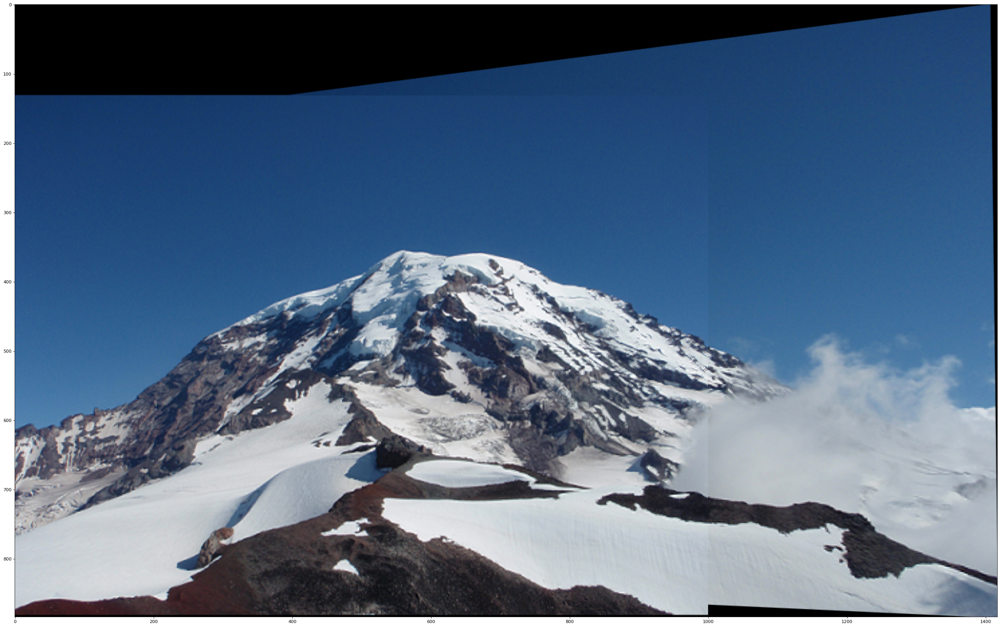

4
[[152, 729]]
[[152, 729], [221, 641]]
[[152, 729], [221, 641], [398, 574]]
[[276, 366]]
[[276, 366], [364, 268]]
[[276, 366], [364, 268], [612, 192]]
[[276, 366], [364, 268], [612, 192], [636, 291]]
[[276, 366], [364, 268], [612, 192], [636, 291], [822, 358]]
[[152, 729], [221, 641], [398, 574], [418, 659]]
[[152, 729], [221, 641], [398, 574], [418, 659], [554, 715]]
[[276, 366], [364, 268], [612, 192], [636, 291], [822, 358], [542, 337]]
[[152, 729], [221, 641], [398, 574], [418, 659], [554, 715], [351, 698]]
[[276, 366], [364, 268], [612, 192], [636, 291], [822, 358], [542, 337], [160, 93]]
[[152, 729], [221, 641], [398, 574], [418, 659], [554, 715], [351, 698], [83, 493]]
[[152, 729], [221, 641], [398, 574], [418, 659], [554, 715], [351, 698], [83, 493], [19, 513]]
[[276, 366], [364, 268], [612, 192], [636, 291], [822, 358], [542, 337], [160, 93], [72, 118]]
[[ 7.00609053e-01 -8.91256947e-02 -2.20579986e+01]
 [ 2.76985306e-02  6.47266559e-01  4.20032976e+02]
 [ 5.22345613e-05 -2.8

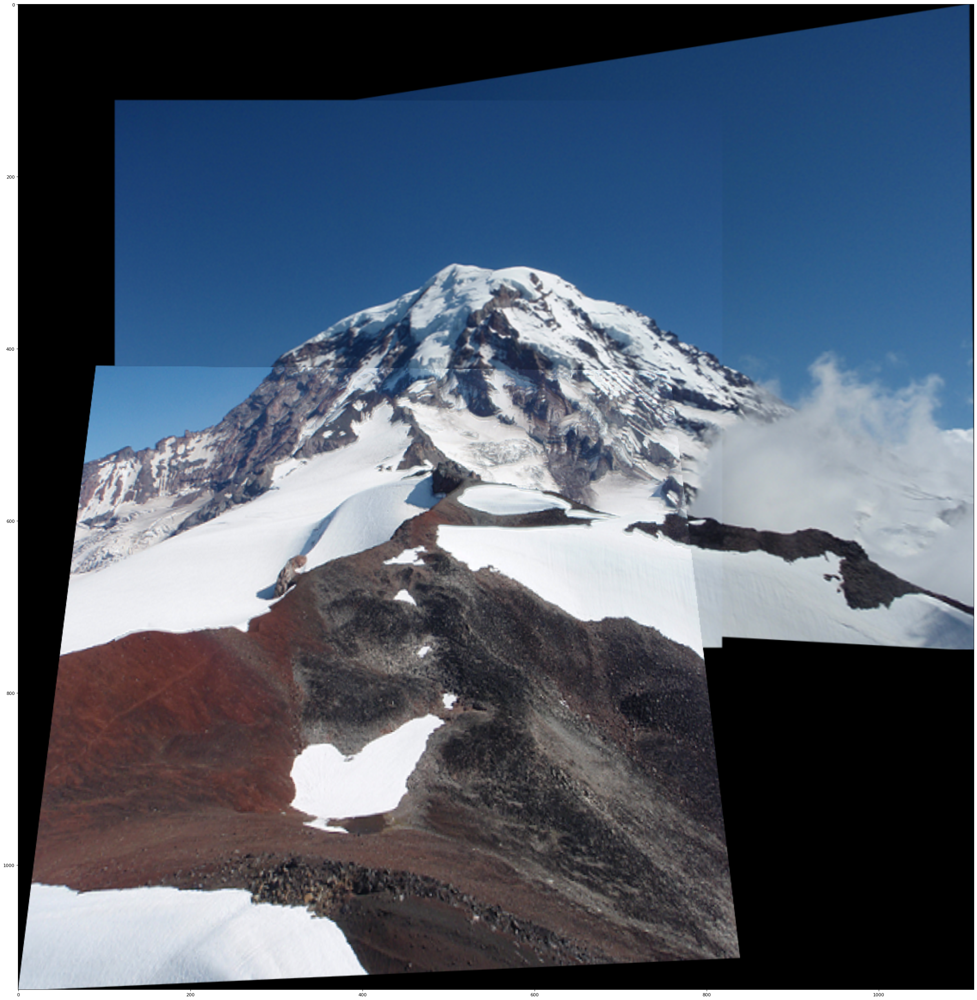

5


In [ ]:
stitch_pair(imgs, stitched, idx_ref, idx_ref, spanning_tree, H_dict)

In [ ]:
H_dict